In [1]:
# Import packages required for the project
import numpy as np
import pandas as pd
import folium
import geopandas as gpd
pd.options.mode.chained_assignment = None
import warnings
from matplotlib.cbook import boxplot_stats
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from folium import plugins
import locale
from folium.plugins import HeatMap
warnings.filterwarnings('ignore')

In [2]:
# Load data into a Pandas DataFrame (CSV file size is over 100 MB, so it it may take a while tp download it)
df = pd.read_csv('https://kostya.io/static/data/hong_kong_property_transactions_files/hk_property_transactions.csv')

In [3]:
# Preview the first 10 rows
df.head(10)

,Building unit type,Building Location,Building Estate,District,Longitude,Latitude,Building Floor,Building Unit,Building Net Area,Building Gross Area,Building Price hkd,Price per net area,Price per gross area,Transaction date,% change from previous transaction,date of previous transaction
0,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,A,787,-,625,"7,943",-,11/26/96,NaN,NaN
1,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,B,624,-,22,352,-,11/28/16,-96.60%,8/22/11
2,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,B,624,-,647,"10,360",-,8/22/11,7.80%,4/14/97
3,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,B,624,-,600,"9,611",-,4/14/97,25.00%,11/26/96
4,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,B,624,-,480,"7,688",-,11/26/96,NaN,NaN
5,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,C,624,-,455,"7,288",-,6/4/96,NaN,NaN
6,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,D,708,876,530,"7,483","6,050",1/13/97,NaN,NaN
7,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,E,766,-,938,"12,239",-,6/21/11,45.70%,6/23/09
8,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,E,766,-,644,"8,400",-,6/23/09,29.30%,10/5/06
9,B000000014,Taikoo Shing,Fu Tien Mansion,EST,114.2175,22.2871,26,E,766,-,498,"6,498",-,10/5/06,-33.60%,4/26/97


In [4]:
# Print column names and data types
df.dtypes

Building unit type                     object
Building Location                      object
Building Estate                        object
District                               object
Longitude                             float64
Latitude                              float64
Building Floor                         object
Building Unit                          object
Building Net Area                      object
Building Gross Area                    object
Building Price hkd                      int64
Price per net area                     object
Price per gross area                   object
Transaction date                       object
% change from previous transaction     object
date of previous transaction           object
dtype: object

* 13 out of 16 columns are strings
* 'Latitude' and 'Longitude' column values are float variables
* 'Building Price Hkd' column values are integers; 

In [5]:
# Convert 'Transaction date' values from string to DateTime
df['DateTime'] = pd.to_datetime(df['Transaction date'])

# Extract transaction year from DateTime values
df['Year'] = df['DateTime'].dt.year

# Get the most recent year for which transaction data is available
max_year = df['Year'].max()

# Select subset of data including only the most recent year transactions (2019)
max_year_df = df.loc[df['Year'] == max_year]

In [6]:
# Create a subset of the data including the following columns: 'District', 'Building Net Area', 'Building Price hkd'
df_2019 = max_year_df[['District', 'Building Net Area', 'Building Price hkd']].copy()

# Convert 'Building Net Area' data type from string to integer
df_2019['Building Net Area'] = pd.to_numeric(df_2019['Building Net Area'], errors='coerce')

# Select records with non-NaN values in the 'Building Net Area' column
df_2019 = df_2019[~df_2019['Building Net Area'].isna()]

# Convert price to HKD (e.g., 787 to HKD $7,870,000)
df_2019['Building Price hkd'] = df_2019['Building Price hkd'] * 10000

# Create a new 'Price per Square Foot' column
df_2019['Price Per Square Foot'] = round(df_2019['Building Price hkd'] / df_2019['Building Net Area'])

In [7]:
# Change District names from abbrevaiations to capitalized full names

# Create a dictionary with district names
districts_dict = {'EST':'EASTERN',
                  'SSP':'SHAM SHUI PO',
                  'CW':'CENTRAL & WESTERN',
                  'TM':'TUEN MUN',
                  'STH':'SOUTHERN',
                  'ST':'SHA TIN',
                  'SK':'SAI KUNG',
                  'WC':'WAN CHAI',
                  'KT':'KWAI TSING',
                  'WTS':'WONG TAI SIN',
                  'NTH':'NORTH',
                  'YTM':'YAU TSIM MONG',
                  'YL':'YUEN LONG',
                  'KC':'KWUN TONG',
                  'TW':'TSUEN WAN',
                  'ILD':'ISLANDS',
                  'KLC':'KOWLOON CITY',
                  'TP':'TAI PO'}

# Update the dataframe to include full district names
df_2019['District'] = df_2019.District.map(districts_dict)

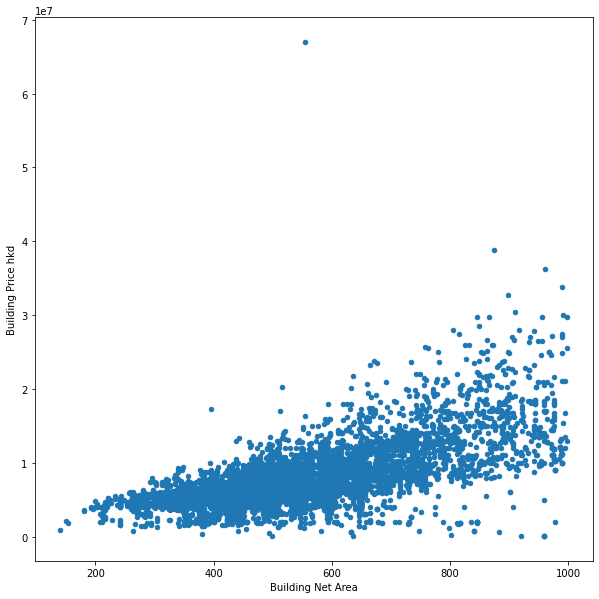

In [8]:
# Create a scatter plot to check if the dataset includes outliers

ax = df_2019.plot.scatter(x='Building Net Area',
                          y='Building Price hkd',
                          figsize=(10,10))

From scatter plot in the previos cell, we can tell that there are numerous outliers in the dataset. For example there are relatively small properties that have extremely high prices as well as larger properties that have low prices.

We will use boxplot stats (lower and upper whiskers) to determine the boundaries of the data distribution; we will then remove values above and below the whisker values.

In [9]:
# Get boxplot stats
stats = boxplot_stats(df_2019['Price Per Square Foot'].values)

# Remove records with 'Price per Area' values above and beyond upper and lower whiskers respectively.
df_2019.drop(df_2019[(df_2019['Price Per Square Foot'] > stats[0]['whishi']) | (df_2019['Price Per Square Foot'] < stats[0]['whislo'])].index, inplace = True)

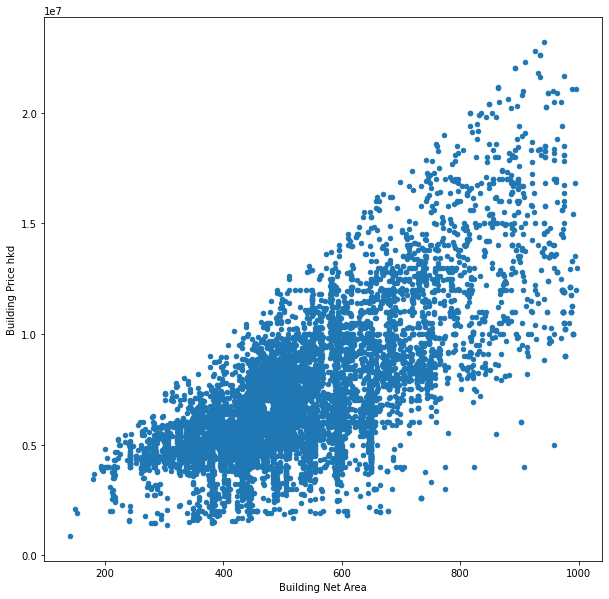

In [10]:
# Check destribution of the updated data

ax = df_2019.plot.scatter(x='Building Net Area',
                          y='Building Price hkd',
                          figsize=(10,10))

In [11]:
# Create a dataset with average values for 'Building Net Area', 'Building Price hkd', 'Price per Area' columns grouped by 'District'
aggregate_data = (df_2019.groupby('District')['Building Price hkd','Building Net Area','Price Per Square Foot'].mean()).reset_index()

# Calculate average transaction value in US dollars.
aggregate_data['Price Per Square Foot usd'] = aggregate_data['Price Per Square Foot'] * 0.13

In [12]:
# Load district boundaries data from a geojson (gj) file
gj_df = gpd.read_file('https://kostya.io/static/data/hong_kong_property_transactions_files/Hong_Kong_18_Districts.geojson')

# Rename the District Name field in the Geopandas DataFrame from ENAME to 'District'
# Make it consistent with aggregate_data column name
gj_df = gj_df.rename(columns={"ENAME": "District"})

# Merge gj_df with aggregate_data to combine district boundaries and pricing data
gj_df = gj_df.merge(aggregate_data, on='District', how='left')

In [13]:
# Format values in the 'Price Per Square Foot' column to US dollars
locale.setlocale( locale.LC_ALL, 'en_US' )
gj_df['Price Per Square Foot str'] = gj_df['Price Per Square Foot usd']

for i in range(0,len(gj_df)):
     gj_df['Price Per Square Foot str'][i] = locale.currency(gj_df['Price Per Square Foot str'][i], grouping = True)
        
for j in range(0, len(gj_df)):
    gj_df['Price Per Square Foot str'][j] = gj_df['Price Per Square Foot str'][j].split(".", 1)[0]
    
# Sort the dataset by per-square-foot prices
gj_df = gj_df.sort_values(by='Price Per Square Foot str', ascending=True)

In [14]:
# Create a Choropleth Map

districts_json = "Hong_Kong_18_Districts.geojson"

m = folium.Map(location=[22.3193039,114.1693611], zoom_start=11)

folium.Choropleth(
    geo_data=gj_df,
    name="choropleth",
    data=aggregate_data,
    columns=["District", "Price Per Square Foot usd"],
    key_on="feature.properties.District",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Price per Square Foot (USD, $)",
).add_to(m)

style_function = lambda x: {'fillColor': '#ffffff',
                            'color':'#000000',
                            'fillOpacity': 0.1,
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000',
                                'color':'#000000',
                                'fillOpacity': 0.50,
                                'weight': 0.1}
  


info = folium.features.GeoJson(
   gj_df,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['District', 'Price Per Square Foot str'],
        aliases=['District: ', 'Average Price per Square Foot: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
)
m.add_child(info)
m.keep_in_front(info)

#folium.LayerControl().add_to(m)
m

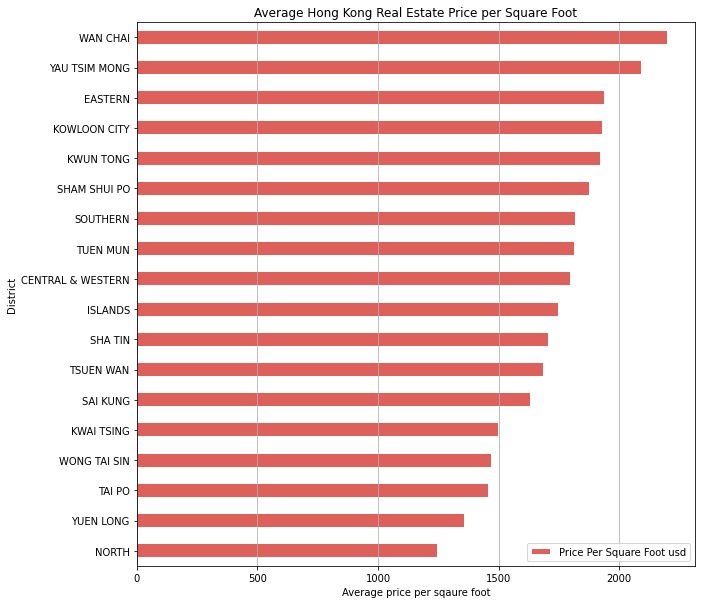

In [15]:
# Create a Horizontal Bar Chart with per-square-foot prices by district (descending order)

gj_df.plot.barh(x='District', y='Price Per Square Foot usd', title='Average Hong Kong Real Estate Price per Square Foot', figsize=(10,10), color='#de605b', edgecolor="white", linewidth="2")

plt.grid(which="major", axis='x', zorder=-1.0)
plt.rcParams['axes.facecolor']='#222222'
plt.xlabel('Average price per sqaure foot')
plt.show()

We can see that property prices in the area on both side of Victoria Harbour (Hong Kong Island and Kowloon) are the highest; prices decrease as the distance from Victoria Harbor increases, with the most affordable property prices in the Norther areas of New Territories.

Victoria Peak (located in the Central and Western district) is know as the area with the world's least afforable real estate prices, but the data and visualization suggests that the Central & Western district is not the most unaffordable area of Hong Kong. These may be due to the fact that, Victoria Peak and surrounding residential neighborhoods comprise a small percentage of the overall distric area with fewer transactions compared to the rest of the district. We will create a heatmap to visualize geographic distribution of the property transaction in the district in 2019.

In [16]:
# Create a subset of the dataframe based on the following conditions: District = 'Central and Wester' and Year = 2019
central_western_df = df.loc[(df['District'] == "CW") & (df['Year'] == 2019)]

In [17]:
heat_data = [[row['Latitude'],row['Longitude']] for index, row in central_western_df.iterrows()]
map = folium.Map(location=[22.2753039,114.1403611], zoom_start = 14)

# Plot it on the map
HeatMap(heat_data).add_to(map)

# Display the map
map

This heatmap validates my guess that the absolute majority of the Central and Western district's properties transacted in 2019 were located outside of the most expensive area of Hong Kong island, known as Victoria Peak (at least, per the data included in this dataset.)